**Lab 5: FIR Filtering 2**

The goal of this lab is to study the response of FIR filters to inputs such as complex exponentials and sinusoids. In the experiments of this lab, you will use `np.convolve()` to implement filters and `freqz()` to obtain the filter’s frequency response. As a result, you should learn how to characterize a filter by knowing how it reacts to different frequency components in the input.
This lab also introduces two practical filters: bandpass filters and nulling filters.
Bandpass filters can be used to detect and extract information from sinusoidal signals,
e.g., tones in a touch-tone telephone dialer. Nulling filters can be used to remove
sinusoidal interference, e.g., jamming signals in a radar.

In [24]:
!git clone https://github.com/pzinemanas/sis1lab.git

import os
import numpy as np
import librosa
import IPython.display as ipd
from scipy import signal
import matplotlib.pyplot as plt

from sis1lab.util import load_audio, plot_signals, plot_spectrogram, plot_mean_spectrogram, save_audio

fatal: destination path 'sis1lab' already exists and is not an empty directory.


1.1. First, let's replicate what we did until now. Copy the functions synthesize and envelope and obtain the synthesis from the last lab.

In [25]:
!git clone https://github.com/JamesBedsonUPF/sis1_group9.git
filepath = "./sis1_group9/HarpSound.wav"
ref, fs = load_audio(filepath)

fatal: destination path 'sis1_group9' already exists and is not an empty directory.


In [26]:
def averaging_filter(x, N, mode):
  b_k = [1/N]*N
  y = np.convolve(b_k, x, mode)
  return y

def synthesize(f0, phi, Ak, t):
  y = 0
  for k in range(1, len(Ak) + 1):
    y += Ak[k-1] * np.cos(2*np.pi*k*f0*t + k*phi - (k-1)*np.pi/2)
  return y

def envelope(x, N):
  abs_x = np.abs(x)
  y = averaging_filter(abs_x, N, "valid")
  return y 

In [27]:
envelope_signal = envelope(ref, 500)
Ts = 1/float(fs)
t = np.arange(0, len(envelope_signal)*Ts, Ts)
t1 = 0.1004771
frequency = 1071.277
period = 1 / frequency
start = 0.1
rad_frequency = 2 * np.pi * frequency
our_phi = - rad_frequency * t1
weights = [1, 0.11245, 0.008772, 0.01561, 0.001569, 0.0012267, 0.000644, 0.0006886015, 0.000566, 0.000487, 0.000531]
synthesized_signal = synthesize(frequency, our_phi, weights, t)
#synthesized_signal = (weights[1] * synthesized_signal-0.001) / np.amax(synthesized_signal)

multiplied = synthesized_signal[:-1] * envelope_signal

1.2 Plot both reference and synthesised signal.

In [28]:
plot_signals([ref, multiplied], fs, name=['reference', 'synthesised'])

---

**2. Averaging filter**

Now let's analyze the frequency response of the average filter used in the envelope function. The Scipy Python module has a function called *freqz()* for computing the frequency
response of a discrete-time LTI system. The following Python statements show how to
use freqz to compute and plot both the magnitude (absolute value) and the phase of
the frequency response of a four-point averaging system as a function of ω in the range − π ≤ ω ≤ π :

In [29]:
from sis1lab.util import plot_frequency_response

In [30]:
ww = np.arange(-np.pi, np.pi, np.pi/500)
_, HH = signal.freqz([1/4]*4, 1, ww)

plot_frequency_response(ww, HH)

For FIR filters, the second argument of `freqz(-, 1,- )` must always be equal to 1. The frequency vector ww should cover an interval of length 2π for ω , and its spacing must be fine enough to give a smooth curve for H(ejω) . Note: we will always use capital H for the frequency response.

2.1 Use the `freqz` and `plot_frequency_response` functions to plot the frequency response of the averaging filter of your envelope function.



In [31]:
N = 500
ww = np.arange(-np.pi, np.pi, np.pi/500)
_, HH = signal.freqz([1/N]*N, 1, ww)

plot_frequency_response(ww, HH)

2.2 Looking at the frequency responses, what are the main differences between your filter and the four-point averaging filter. What happens when the value N is increased?

The averaging filter is a low pass filter. As N increases, the number of frequencies that are cancelled increases as well and the slope gets steeper. We say slope because in theory the amplitude is composed of multiple cosine functions. However, due to the ammount of changes in amplitude and frequency over the whole spectrum, the graphical representation is not as accurate as it should be.

---

**3. Nulling Filters for Rejection**

Nulling filters are filters that completely eliminate some frequency components. If the frequency is $\omega=0$ or $\omega=\pi$ then a two-point FIR filter will do the nulling. The simplest possible general nulling filter can have as few as three coefficients. If $\omega_n$ is the desired nulling frequency, then the following length-3 FIR filter

$$
y[n] = x[n] - 2\cos(\omega_n)x[n-1] + x[n-2] 
$$

will have a zero in its frequency response at $\omega=\omega_n$. For example, a filter designed to completely eliminate signals of the form $e^{j0.5\pi}$ would have the following coefficients because we would pick the desired nulling frequency to be $\omega_n = 0.5\pi$

$$
b_0 = 1, \quad b1=-2cos(\omega_n)=0, \quad b_2=1
$$

3.1 Use the following function to add an interference in your reference signal. Name the corrupted signal as `x_interf`.

In [32]:
def add_interference(x, fs):
  t = np.linspace(0, len(x)*1/float(fs), len(x))
  y = x + (np.amax(x)/10)*np.sin(2*np.pi*6000*t)
  return y

In [33]:
# Write your code here
x_interf = add_interference(multiplied, fs)

ipd.Audio(x_interf, rate=fs)

3.2 Plot both the reference signal and the corrupted signal and listen to the latter one. 

In [34]:
plot_signals([ref, x_interf], fs, name=['reference', 'corrupted'])

3.3 Compare the spectrograms of the reference signal and the interference signal. 

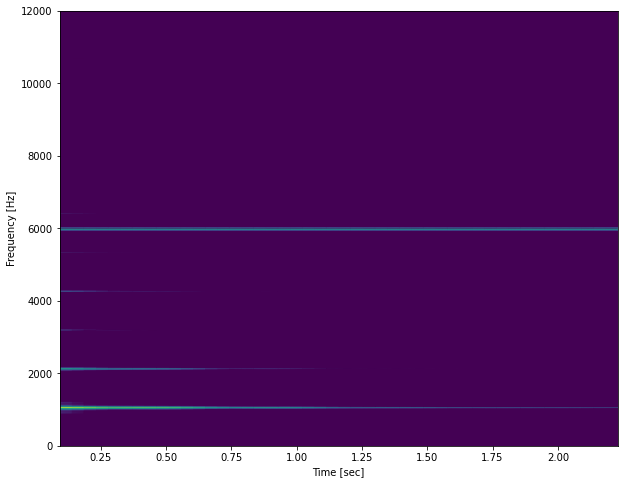

In [35]:
# Interference signal
window_length = 8192
ff, tt, S = signal.spectrogram(x_interf, fs, nperseg=window_length, noverlap=window_length/2)

plt.figure(figsize=(10,8))
plot_spectrogram(ff, tt, S)
plt.ylim([0, 12000])
plt.show()

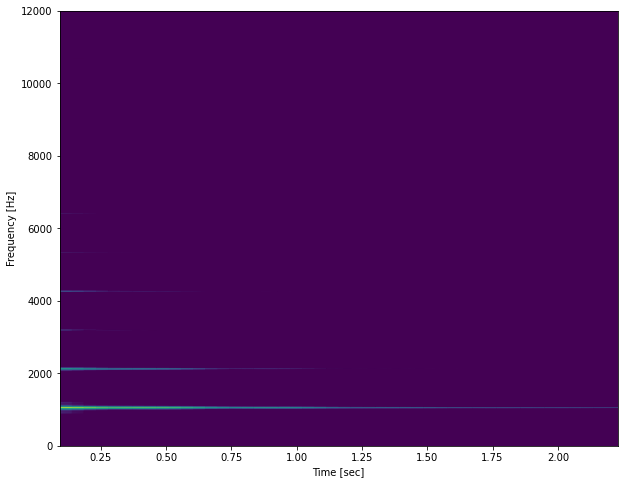

In [36]:
# We will plot the signal where we have added the noise, that is, the synthesised signal
window_length = 8192
ff, tt, S = signal.spectrogram(multiplied, fs, nperseg=window_length, noverlap=window_length/2)

plt.figure(figsize=(10,8))
plot_spectrogram(ff, tt, S)
plt.ylim([0, 12000])
plt.show()

As we can see, in the interference signal's spectrogram there is a line at 6000Hz which represents the noise that we have added. Its default value was 1000Hz but we have changed it because our fundamental frequency is close to 1000Hz and we wanted the difference in the spectrograms to be more clear.

3.4. Create a function `remove_interference(x, fs)` that applies a nulling filter devised to remove the interference at 1000 Hz. 

Note: remember that a frequency can be converted to the normalized radian frequncy by: $\omega_n = 2\pi f_n/f_s$

In [37]:
"""Applies nulling filter to remove an interference at 6000 Hz

  Parameters
  ----------
  x : np.array
      The input signal in the form of a numpy array
  fs : int or float
      Frequency rate in Hz

  Returns
  -------
  y : np.array
      The output of the filter

  """
def remove_interference(x, fs):
    # Applying the formula
    b_k = [1, -2*np.cos((2 * np.pi * 6000)/fs), 1]
    y = np.convolve(b_k, x, "valid")

    return y

In [38]:
# Extra plot to see the magnitude and phase of the nulling filter
ww = np.arange(-np.pi, np.pi, np.pi/500)
_, HH = signal.freqz([1, -2*np.cos((2 * np.pi * 6000)/fs), 1], 1, ww)

plot_frequency_response(ww, HH)

We have plotted the frequency response of the filter that we have used to remove the 6000Hz frequency. As we can observe in the graph, we are not only removing the frequency that we want but other lower frequencies as well, resulting in a filter that looks more like a high pass than a notch.

3.5 Use the `remove_interference` funcion to clean the corrupted signal,  `x_interf`. Call the output as `x_clean`. Compare the spectrograms of both signals. Explain the result.

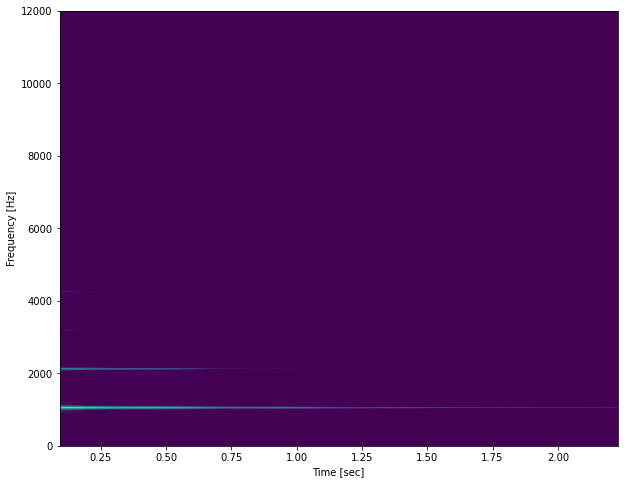

In [39]:
x_clean = remove_interference(x_interf, fs)

# We will plot the signal where we have added the noise, that is, the synthesised signal
window_length = 8192
ff, tt, S = signal.spectrogram(x_clean, fs, nperseg=window_length, noverlap=window_length/2)

plt.figure(figsize=(10,8))
plot_spectrogram(ff, tt, S)
plt.ylim([0, 12000])
plt.show()
ipd.Audio(x_clean, rate=fs)

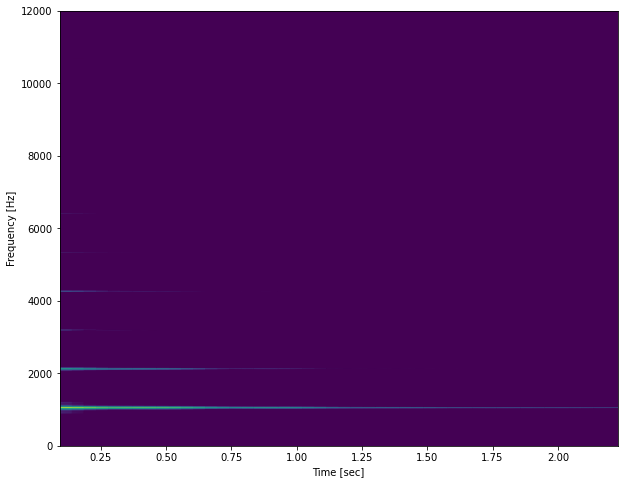

In [40]:
# Synthesised signal without having added noise
window_length = 8192
ff, tt, S = signal.spectrogram(multiplied, fs, nperseg=window_length, noverlap=window_length/2)

plt.figure(figsize=(10,8))
plot_spectrogram(ff, tt, S)
plt.ylim([0, 12000])
plt.show()
ipd.Audio(multiplied, rate=fs)

After having applied the nulling filter, we can see that the frequency that we had added at 6000Hz has been removed. However, we can observe as well that some frequencies from our original signal close to 6000Hz have also been filtered. But, given that the frequencies arround that value do not have a large amplitude, we can barely notice that they have been removed. To obtain a more accurate result, we should implement a more complex filter. 